In [1]:
import json
from pprint import pprint
import pandas as pd
import matplotlib.pyplot as plt
import math 
from time import sleep
from tqdm import tqdm
import networkx as nx
plt.rcParams['font.family'] = 'IPAexGothic'

In [18]:
def make_edge_list(file_path):
    df = pd.read_csv(file_path, encoding='utf-8')
    df = df.groupby(['Pokemon','併用率の高いポケモン'])['Rank_併用率の高いポケモン'].mean()
    df = pd.DataFrame(df).reset_index()
    df.columns = ['From', 'To', 'Weight']
    df['Weight'] = 10-df['Weight']
    return df

In [19]:
file_path = '..//Database//dev//output//rankbattle_stats//ALL_SEASON_TEMOTI_POKEMON.csv'
make_edge_list(file_path).to_csv('Pokemon_Pary_Edge_list.csv', index=False)

In [20]:
network = make_edge_list(file_path)

In [104]:
network

,From,To,Weight
0,アイアント,アシレーヌ,6.600000
1,アイアント,イエッサン,3.000000
2,アイアント,ウインディ,4.222222
3,アイアント,ウオノラゴン,2.000000
4,アイアント,ウルガモス,4.000000
...,...,...,...
35727,ワンリキー,リオル,9.000000
35728,ワンリキー,ルチャブル,1.666667
35729,ワンリキー,レドームシ,8.000000
35730,ワンリキー,ロトム,4.000000


In [85]:
df_rank_season12 = pd.read_csv('..//Database//dev//output//rankbattle_rank//Season12_Single_Ado_Rank.csv')
ranked_pokemkon_list = list(df_rank_season12['Pokemon'])

In [96]:
network_top150 = network[network['From'].isin(ranked_pokemkon_list[:150])]
network_top150 = network_top150[network_top150['To'].isin(ranked_pokemkon_list[:150])]

In [101]:
network_top150_5 = network_top150[network_top150['Weight']>0]
network_top150_5['Weight'] = network_top150_5['Weight'] / 1000000

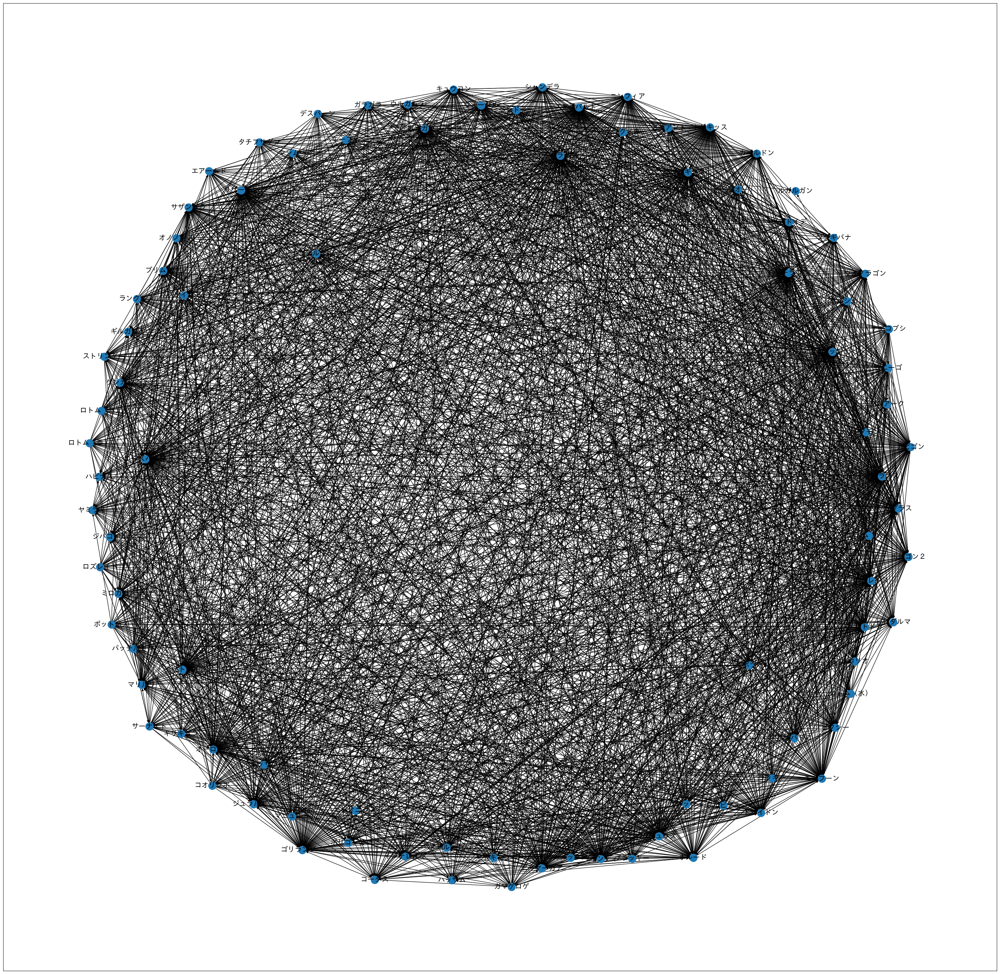

In [102]:
network_np = network_top150_5.values
G = nx.DiGraph()
G.add_weighted_edges_from(network_np)
pos=nx.spring_layout(G)
fig = plt.figure(figsize=(40, 40), dpi=100,facecolor='w', linewidth=0, edgecolor='w')
nx.draw_networkx(G,pos,font_size=16,font_family='IPAexGothic')
fig.show()

In [80]:
network_top150_5.to_csv('tableau_viz_test.csv', index=False)